In [1]:
import scanpy as sc
import anndata as ad
import numpy as np
import os 
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
def plot_qc_metrics(data):

    sns.histplot(data.obs["n_genes_by_counts"].unique())
    plt.title("Unique transcripts per cell")

    plt.tight_layout()
    plt.show()
    
    sc.pl.violin(data, ['n_genes_by_counts','total_counts'], multi_panel=True, show=False)
    plt.gcf().axes[0].set_title('Number of Genes by Counts')
    plt.gcf().axes[1].set_title('Total transcripts per cell')

    plt.tight_layout()
    plt.show()

In [3]:
#reproducibility
np.random.seed(42)

In [4]:
output_dir = "./Output"
file_path = "./data/malpighian_tubule.tsv"
os.makedirs(output_dir, exist_ok=True)

Number of cells: 7015
Number of genes: 12418


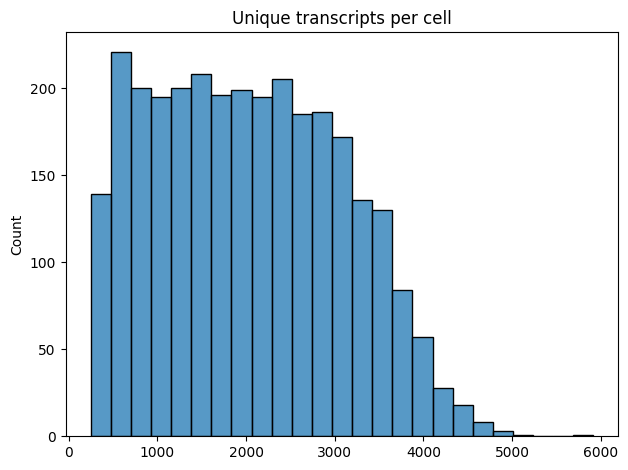

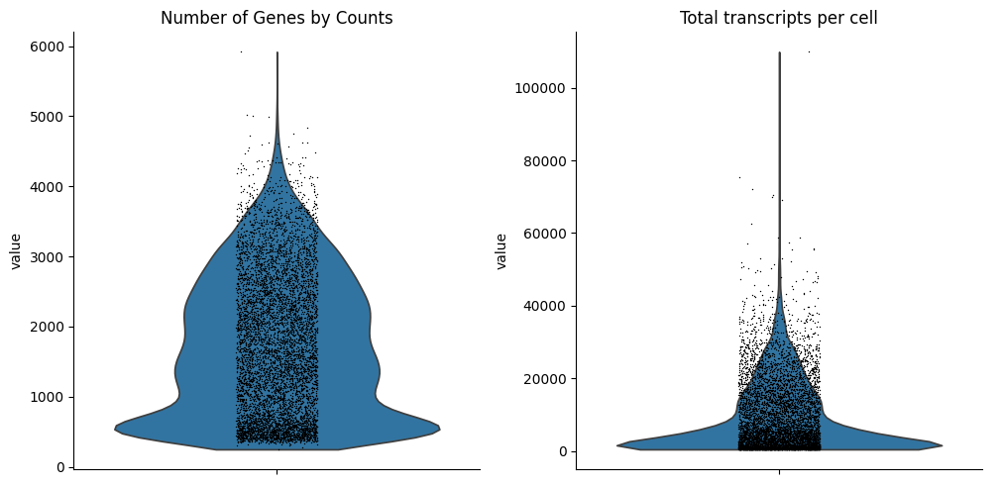

In [5]:
data = sc.read(file_path)
data = data.transpose() #need to transpose it to get it in the right way scanpy expects (cell, genes)

print(f"Number of cells: {data.n_obs}")
print(f"Number of genes: {data.n_vars}")

sc.pp.calculate_qc_metrics(data, inplace=True)
#print(data.obs_names_make_unique)
plot_qc_metrics(data)

Number of cells after filtering: 7015
Number of genes after filtering: 10717


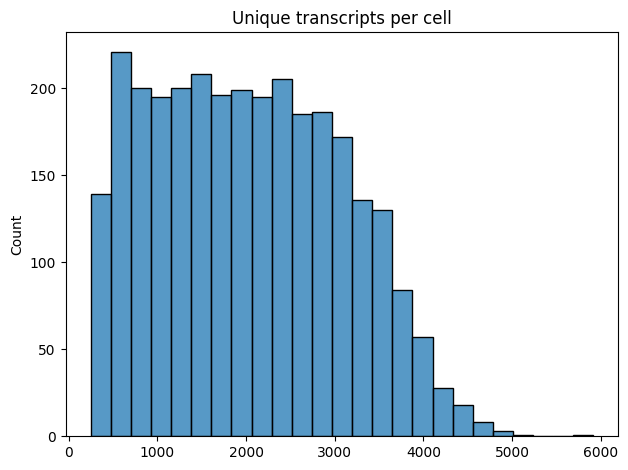

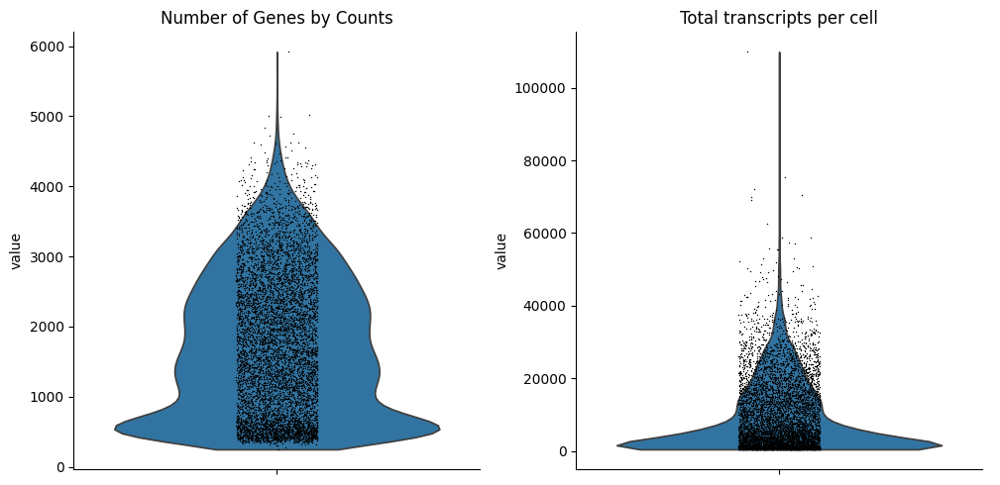

In [ ]:
sc.pp.filter_cells(data, min_genes=500)  #filter out cells with fewer than 10 genes
sc.pp.filter_genes(data, min_cells=100)  #filter out genes expressed in fewer than 10 cells
 
print(f"Number of cells after filtering: {data.n_obs}")
print(f"Number of genes after filtering: {data.n_vars}")

sc.pp.normalize_total(data, target_sum=1e6) #normalize in cpm
sc.pp.log1p(data) #log normalize

plot_qc_metrics(data)

In [7]:
data.obs

,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,n_genes
0,982,6.890609,2142.0,7.669962,28.524743,40.102708,55.695612,77.497666,982
1,1465,7.290293,4850.0,8.486940,26.371134,39.876289,55.381443,76.226804,1465
2,443,6.095825,608.0,6.411819,29.440789,43.585526,60.032895,100.000000,443
3,1755,7.470794,5932.0,8.688285,29.180715,39.666217,52.916386,72.656777,1755
4,1709,7.444249,6548.0,8.787067,32.025046,43.692731,56.948687,75.809407,1709
...,...,...,...,...,...,...,...,...,...
7010,1001,6.909753,1839.0,7.517521,22.675367,34.801523,49.646547,72.756933,1001
7011,2125,7.661998,11506.0,9.350711,30.219016,42.047627,55.814358,75.334608,2125
7012,1237,7.121252,3164.0,8.059908,29.203540,39.285714,53.128951,75.284450,1237
7013,811,6.699500,1805.0,7.498870,34.127424,47.700831,62.049861,82.770083,811


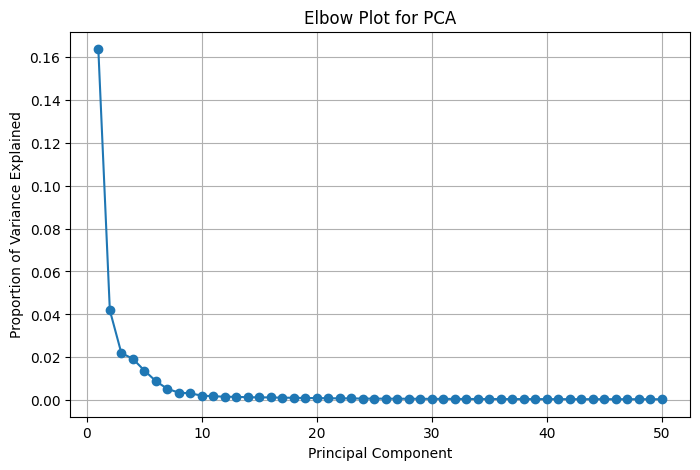

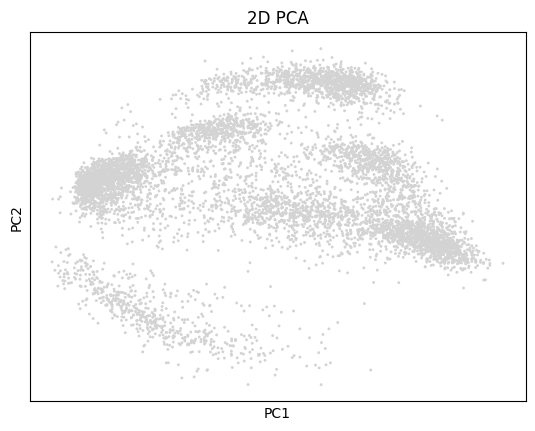

In [8]:
sc.tl.pca(data, svd_solver='arpack', n_comps = 50)

#elbow plot
plt.figure(figsize=(8, 5))
plt.plot(range(1, len(data.uns['pca']['variance_ratio']) + 1), data.uns['pca']['variance_ratio'], marker='o')
plt.xlabel('Principal Component')
plt.ylabel('Proportion of Variance Explained')
plt.title('Elbow Plot for PCA')
plt.grid(True)
plt.show()

#2D plot
sc.pl.pca(data, title='2D PCA')

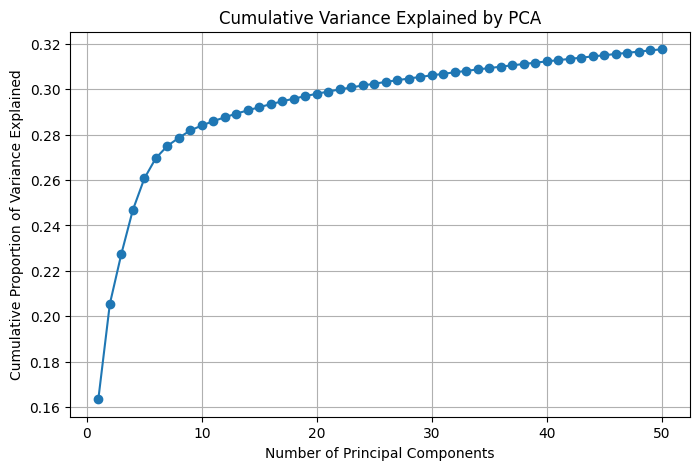

In [9]:
cumulative_variance = np.cumsum(data.uns['pca']['variance_ratio'])

#cumsum plot
plt.figure(figsize=(8, 5))
plt.plot(range(1, len(cumulative_variance) + 1), cumulative_variance, marker='o')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Proportion of Variance Explained')
plt.title('Cumulative Variance Explained by PCA')
plt.grid(True)
plt.show()

Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "numpy\\random\\mtrand.pyx", line 796, in numpy.random.mtrand.RandomState.randint
  File "numpy\\random\\_bounded_integers.pyx", line 2881, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "numpy\\random\\mtrand.pyx", line 796, in numpy.random.mtrand.RandomState.randint
  File "numpy\\random\\_bounded_integers.pyx", line 2881, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (most recent call last):
  File "numpy\\random\\mtrand.pyx", line 796, in numpy.random.mtrand.RandomState.randint
  File "numpy\\random\\_bounded_integers.pyx", line 2881, in numpy.random._bounded_integers._rand_int32
ValueError: high is out of bounds for int32
Exception ignored in: <class 'ValueError'>
Traceback (m

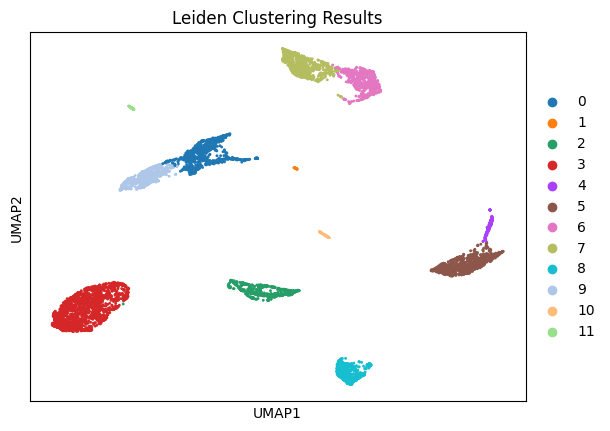

In [ ]:
#can tune PCs
sc.pp.neighbors(data, n_pcs=20)

sc.tl.umap(data, min_dist=0.1)

#tune resolution based on diff gene expression
resolution = 0.1
sc.tl.leiden(data, flavor='igraph', n_iterations=2, directed=False, resolution=resolution) 
        
sc.pl.umap(data, color='leiden', title='Leiden Clustering Results')

In [ ]:
name = "data_with_PCA_umap_" + str(resolution) + "_res.h5ad"
data.write(name)